#### Imports

In [1]:
from utils.datasettemporal import TemporalDataset, TestSubsetRegression
from utils.config import PROJECT_ROOT
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import math

#### Dataset Loading

In [ ]:
dataset = TemporalDataset(season="autumn", data_processor="xarray", feature_coarsen=None, target_coarsen=None, grid_size=21)
print(f"Dataset size: {len(dataset)}")
print(f"Dataset shape: {dataset[0][0].shape}, label shape: {dataset[0][1].shape}")

ten
/mnt/c/Users/samue/SynologyDrive/OceanPropInfSatImg/data/monthly/ten_sample_1993-2003.nc


/mnt/c/Users/samue/SynologyDrive/OceanPropInfSatImg/src/utils/datasettemporal.py:70: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  for key, _ in self.dataset.dims.items():
<frozen _collections_abc>:894: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.


361
481
21
False
Dataset size: 4692000
Dataset shape: torch.Size([6, 21, 21]), label shape: torch.Size([1])


#### Full original

(121, 1, 361, 481) (121, 6, 361, 481)


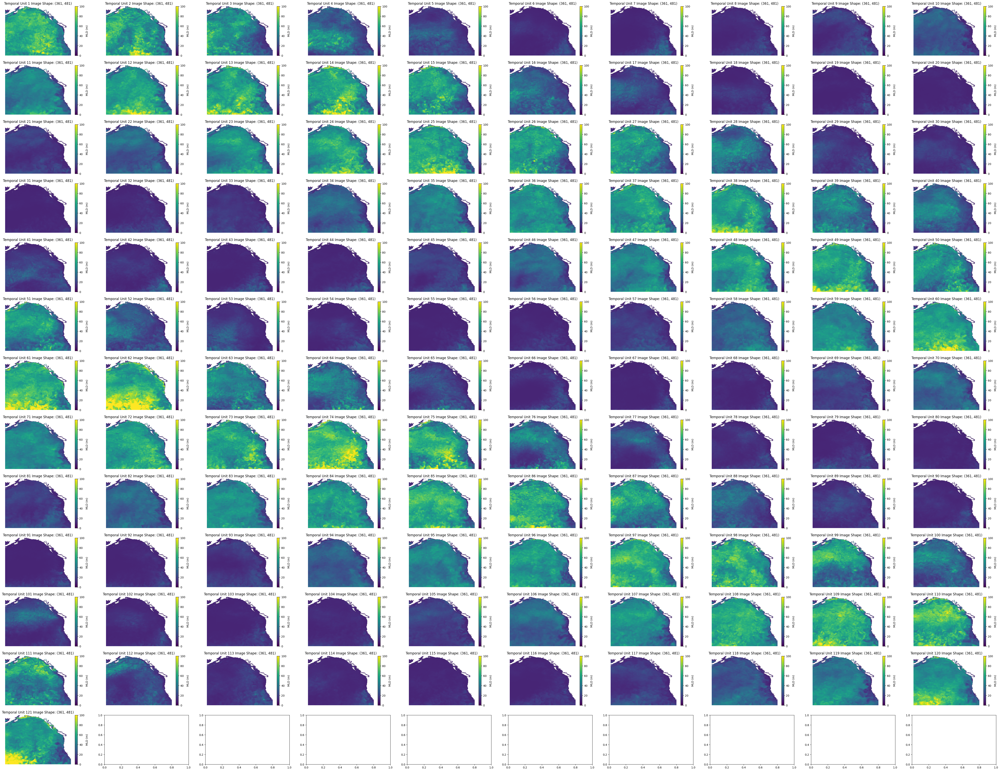

In [3]:
annotation_map, feature_map = dataset.annotations_map, dataset.feature_map

print(annotation_map.shape, feature_map.shape)

annotation_map_to_plot = np.squeeze(annotation_map)

#unit = 12
unit = 10

fig, ax = plt.subplots(math.ceil(annotation_map.shape[0]/unit), unit, figsize=(math.ceil(annotation_map.shape[0]/unit) * 5, 5 * unit))
ax = np.atleast_2d(ax)


for month, image in enumerate(annotation_map_to_plot):
    im = ax[month//unit, month%unit].imshow(image, cmap='viridis', vmax=100, vmin=0, origin='lower')
    ax[month//unit, month%unit].set_title(f"Temporal Unit {month+1} Image Shape: {image.shape}")
    ax[month//unit, month%unit].axis('off')
    fig.colorbar(im, label='MLD (m)', ax=ax[month//unit, month%unit])

#### By Pixel

In [4]:
lat_range = dataset.feature_map.shape[-2]
lon_range = dataset.feature_map.shape[-1]
temp_unit_range = [j for j in range(dataset.feature_map.shape[0]) if j%12 in dataset.relevant_months]

mld = np.zeros((len(temp_unit_range), lat_range, lon_range))
average_mld = np.zeros((len(temp_unit_range), lat_range, lon_range))
full_mld = np.zeros((len(temp_unit_range), lat_range, lon_range))

for i in range(len(dataset)):
    grid_coords, centre_coords, temp_unit = dataset.grid_and_centre_coords_and_temp_unit[i]
    temp_unit_indexed = temp_unit_range.index(temp_unit)
    image = dataset.feature_map[temp_unit, :, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size]
    label = dataset.annotations_map[temp_unit, :, centre_coords[0], centre_coords[1]]
    avg_label = dataset.annotations_map[temp_unit, :, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size].mean(axis=(1, 2))

    mld[temp_unit_indexed, centre_coords[0], centre_coords[1]] = label
    average_mld[temp_unit_indexed, centre_coords[0], centre_coords[1]] = avg_label

for i in range(len(temp_unit_range)):
    temp_unit = temp_unit_range[i]
    full_mld[i] = dataset.annotations_map[temp_unit, :, :, :]


/tmp/ipykernel_1769920/1548994578.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mld[temp_unit_indexed, centre_coords[0], centre_coords[1]] = label
/tmp/ipykernel_1769920/1548994578.py:17: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  average_mld[temp_unit_indexed, centre_coords[0], centre_coords[1]] = avg_label


In [5]:
mld.shape

(30, 361, 481)

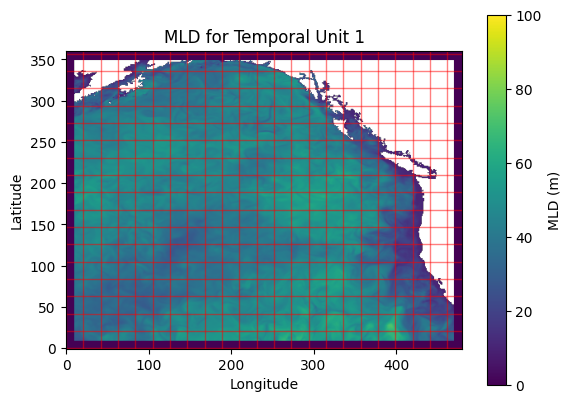

In [6]:
plt.imshow(mld[10, :, :], cmap='viridis', vmax=100, vmin=0, origin='lower')
plt.title("MLD for Temporal Unit 1")
plt.colorbar(label='MLD (m)')
plt.xlabel("Longitude")
plt.ylabel("Latitude")

# Add custom grid overlay
grid_size = dataset.grid_size  # Change this value to adjust grid size
y_max, x_max = mld[10, :, :].shape

# Draw vertical grid lines
for x in range(0, x_max, grid_size):
    plt.axvline(x, color='red', alpha=0.5, linestyle='-', lw=1)

# Draw horizontal grid lines
for y in range(0, y_max, grid_size):
    plt.axhline(y, color='red', alpha=0.5, linestyle='-', lw=1)

plt.show()

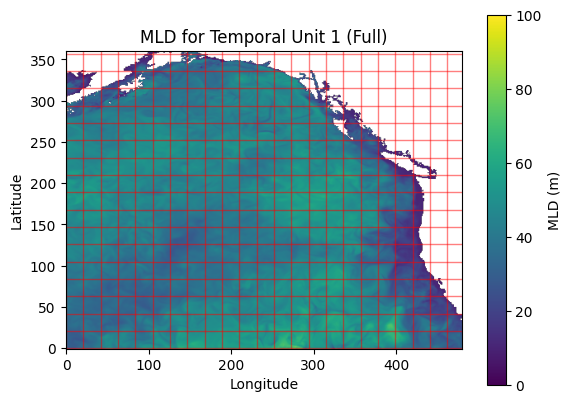

In [7]:
plt.imshow(full_mld[10, :, :], cmap='viridis', vmax=100, vmin=0, origin='lower')
plt.title("MLD for Temporal Unit 1 (Full)")
plt.colorbar(label='MLD (m)')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
# Add custom grid overlay
grid_size = dataset.grid_size  # Change this value to adjust grid size
y_max, x_max = mld[10, :, :].shape

# Draw vertical grid lines
for x in range(0, x_max, grid_size):
    plt.axvline(x, color='red', alpha=0.5, linestyle='-', lw=1)

# Draw horizontal grid lines
for y in range(0, y_max, grid_size):
    plt.axhline(y, color='red', alpha=0.5, linestyle='-', lw=1)

plt.show()

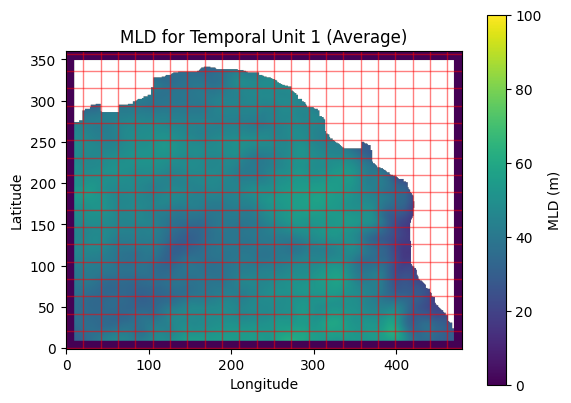

In [8]:
plt.imshow(average_mld[10, :, :], cmap='viridis', vmax=100, vmin=0, origin='lower')
plt.title("MLD for Temporal Unit 1 (Average)")
plt.colorbar(label='MLD (m)')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
# Add custom grid overlay
grid_size = dataset.grid_size  # Change this value to adjust grid size
y_max, x_max = mld[10, :, :].shape

# Draw vertical grid lines
for x in range(0, x_max, grid_size):
    plt.axvline(x, color='red', alpha=0.5, linestyle='-', lw=1)

# Draw horizontal grid lines
for y in range(0, y_max, grid_size):
    plt.axhline(y, color='red', alpha=0.5, linestyle='-', lw=1)

plt.show()

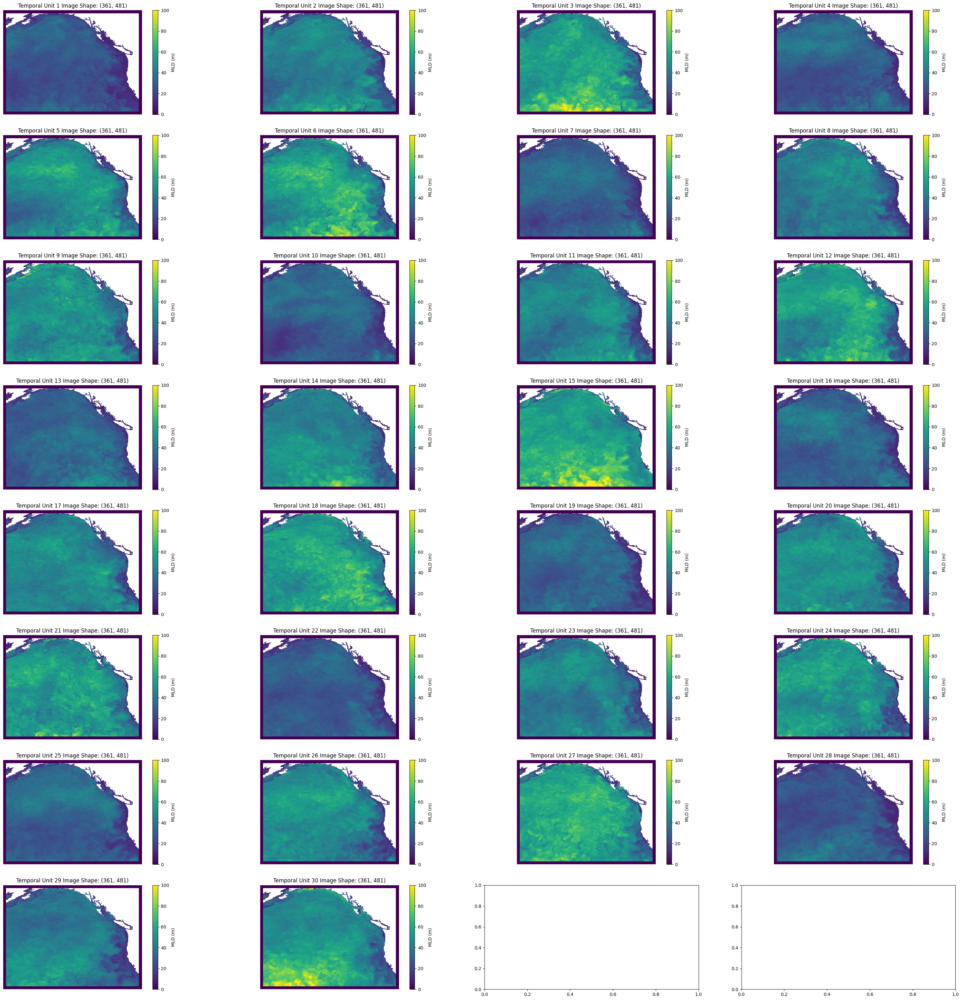

: 

In [ ]:
unit = 4

fig, ax = plt.subplots(math.ceil(mld.shape[0]/unit), unit, figsize=(math.ceil(mld.shape[0]/unit) * 5, 10 * unit))
ax = np.atleast_2d(ax)
for i in range(mld.shape[0]):
    im = ax[i//unit, i%unit].imshow(mld[i, :, :], cmap='viridis', vmax=100, vmin=0, origin='lower')
    ax[i//unit, i%unit].set_title(f"Temporal Unit {i+1} Image Shape: {mld[i, :, :].shape}")
    ax[i//unit, i%unit].axis('off')
    fig.colorbar(im, label='MLD (m)', ax=ax[i//unit, i%unit])